# Depth to Image with Marigold estimating the Depth Map


In [1]:
!pip install diffusers -qq
!pip install accelerate -qq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 6.0 MB/s eta 0:00:00


In [2]:
import argparse
import os
from glob import glob
import logging
import shutil


import numpy as np
import torch
from PIL import Image
from diffusers import DiffusionPipeline
from diffusers.utils import load_image
from tqdm.auto import tqdm

import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from diffusers import StableDiffusionDepth2ImgPipeline
from diffusers.utils import load_image, make_image_grid

from glob import glob
import math
import numpy as np
import matplotlib.pyplot as plt

from google.colab import files

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [3]:
pipe = DiffusionPipeline.from_pretrained(
    "Bingxin/Marigold",
    custom_pipeline="marigold_depth_estimation"
    # torch_dtype=torch.float16,                # (optional) Run with half-precision (16-bit float).
)

pipe.to("cuda")

model_index.json:   0%|          | 0.00/421 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:672: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


(…)s/community/marigold_depth_estimation.py:   0%|          | 0.00/6.49k [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/888 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

MarigoldPipeline {
  "_class_name": "MarigoldPipeline",
  "_diffusers_version": "0.25.0",
  "_name_or_path": "Bingxin/Marigold",
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
pipeline = StableDiffusionDepth2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-depth",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to("cuda")

model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

depth_estimator/config.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/923 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.07k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/732 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/490M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Load the image

In [ ]:
url = "https://i.imgur.com/7zWdoN1.jpg"
init_image = load_image(url).resize((2048,2048))

## Run the Depth Inference pipeline

In [ ]:
# Check if the image is in the allowed extension list
EXTENSION_LIST = [".jpg", ".jpeg", ".png"]
if isinstance(init_image, str) and os.path.splitext(init_image)[1].lower() not in EXTENSION_LIST:
    raise ValueError("Unsupported image format")

# Run Inference on the single image
with torch.no_grad():


    # Predict depth (replace with your pipeline code)
    # This is a placeholder for the actual pipeline call
    pipeline_output = pipe(
            init_image,
            denoising_steps=10,     # optional
            ensemble_size=10,       # optional
            processing_res=768,     # optional
            match_input_res=True,   # optional
            batch_size=0,           # optional
            color_map="Spectral",   # optional
            show_progress_bar=True, # optional
        )

    depth_pred: np.ndarray = pipeline_output.depth_np
    depth_colored: Image.Image = pipeline_output.depth_colored

    # Convert numpy array to torch tensor
    depth_pred_tensor = ToTensor()(depth_pred)


  Inference batches:   0%|          | 0/5 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/10 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/10 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/10 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/10 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/10 [00:00<?, ?it/s]

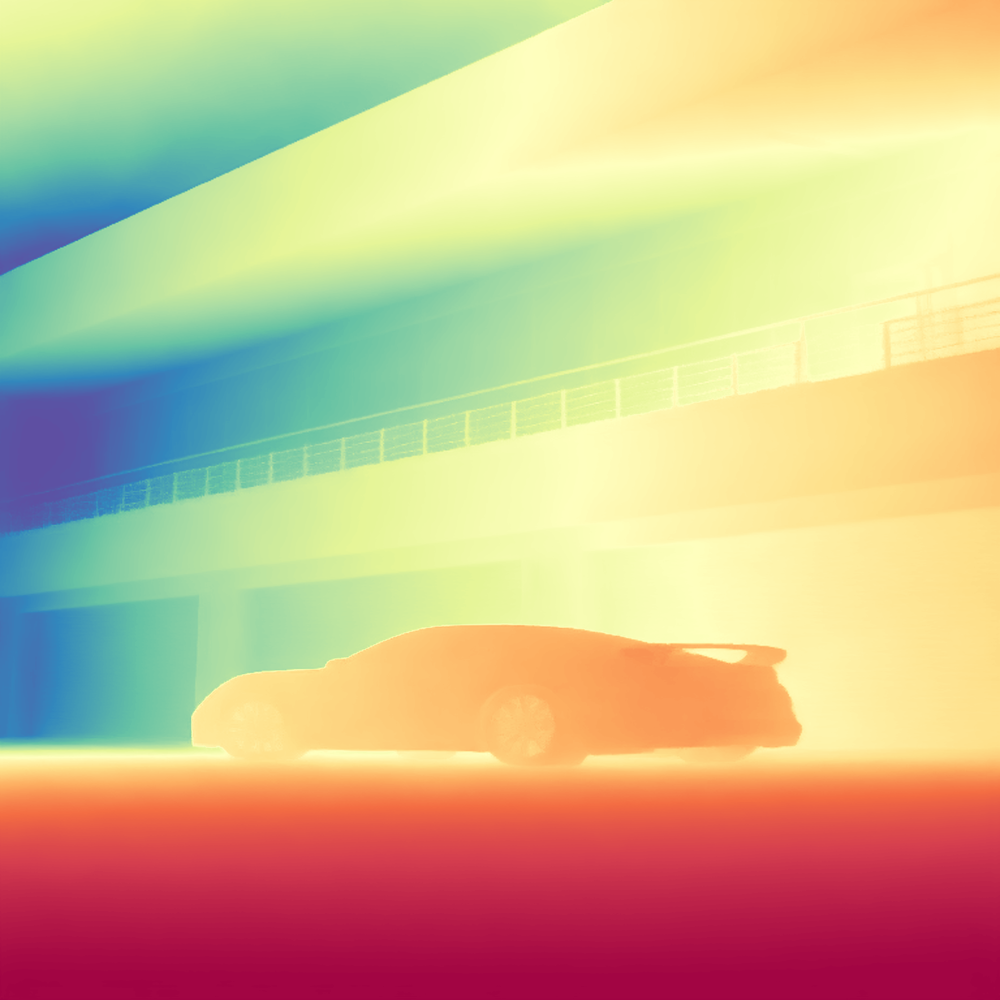

In [ ]:
depth_colored

In [ ]:
transform = transforms.Compose([
	transforms.PILToTensor()
])

In [ ]:
# Convert the PIL image to Torch tensor
init_image_tensor = transform(init_image)

print(init_image_tensor)

tensor([[[ 0,  2,  2,  ..., 44, 39, 39],
         [ 1,  2,  2,  ..., 42, 39, 39],
         [ 1,  1,  1,  ..., 41, 41, 40],
         ...,
         [38, 36, 36,  ..., 72, 72, 72],
         [34, 34, 34,  ..., 73, 71, 71],
         [34, 34, 34,  ..., 72, 71, 69]],

        [[21, 23, 23,  ..., 41, 36, 36],
         [22, 23, 23,  ..., 39, 36, 36],
         [22, 22, 22,  ..., 38, 38, 37],
         ...,
         [39, 37, 37,  ..., 71, 71, 71],
         [38, 38, 38,  ..., 72, 70, 70],
         [38, 38, 38,  ..., 71, 70, 68]],

        [[50, 52, 52,  ..., 34, 29, 29],
         [51, 52, 52,  ..., 32, 29, 29],
         [51, 51, 51,  ..., 31, 30, 30],
         ...,
         [41, 39, 39,  ..., 67, 67, 67],
         [39, 39, 39,  ..., 68, 66, 66],
         [39, 39, 39,  ..., 67, 66, 64]]], dtype=torch.uint8)


In [ ]:
print(depth_pred_tensor)

tensor([[[5.5456e-01, 5.5455e-01, 5.5455e-01,  ..., 3.1002e-01,
          3.0628e-01, 3.0496e-01],
         [5.5479e-01, 5.5485e-01, 5.5502e-01,  ..., 3.1003e-01,
          3.0678e-01, 3.0563e-01],
         [5.5534e-01, 5.5557e-01, 5.5622e-01,  ..., 3.1006e-01,
          3.0809e-01, 3.0739e-01],
         ...,
         [5.2207e-03, 4.5957e-03, 2.7196e-03,  ..., 3.9586e-03,
          3.3097e-03, 3.0987e-03],
         [1.8263e-03, 1.6197e-03, 9.3128e-04,  ..., 2.7107e-03,
          4.8598e-04, 0.0000e+00],
         [5.5954e-04, 4.8633e-04, 1.7394e-04,  ..., 2.2744e-03,
          0.0000e+00, 0.0000e+00]]])


In [ ]:
init_image_tensor.size()

torch.Size([3, 2048, 2048])

In [ ]:
depth_pred_tensor.size()

torch.Size([1, 2048, 2048])

In [ ]:
prompt = "a vintage rolls royce, purple, side profile, high definition, 8K"
negative_prompt = "bad, deformed, ugly, bad anatomy, washed out, low visibility"

  0%|          | 0/75 [00:00<?, ?it/s]

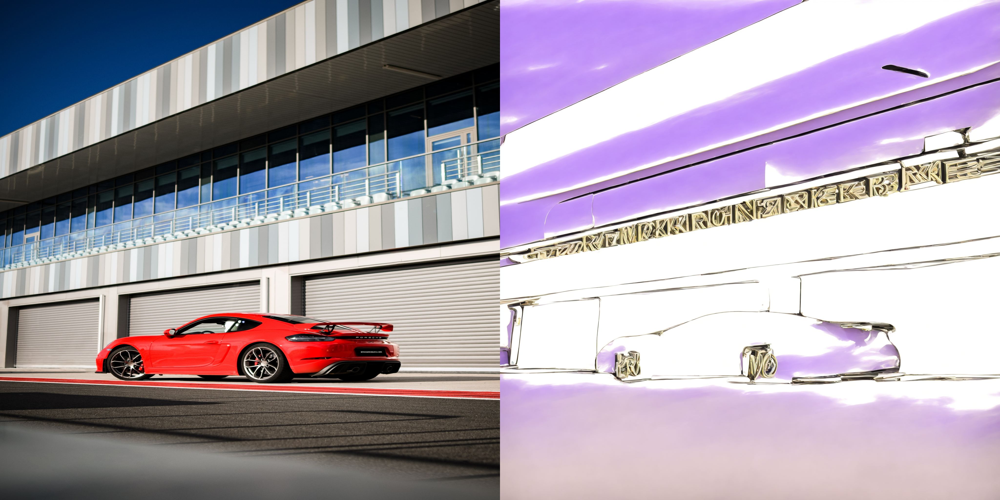

In [ ]:
image2 = pipeline(prompt=prompt, image=init_image_tensor, negative_prompt=negative_prompt, depth_map=depth_pred_tensor, strength=1, guidance_scale=9.0, num_inference_steps=75).images[0]
make_image_grid([init_image, image2], rows=1, cols=2)